# Capstone Project - The Battle of the Neighbourhoods (Week 1)

### Recommending Districts in London for opening a new restaurant, based on similar venues, Income and Population

###### Laura Yates May 2021

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)


## Introduction: Business Problem <a name="introduction"></a>

This project aims to find the optimal location for a restaurant in the London area. It will help people decide where would be best to open new restaurants to ensure there is minimal competition in order to increase revenue. Specifically this report wil target stakeholders that are looking to open a chinese restaurant in London, England.

London is well known for it's eating establishments and can provide a lucrative business option for new business owners wishing to open a restaurant. However, as competition is big, it is important that new business owners take into consideration other similar resturants in the area in which they wish to open.

Since there are numerous restaurants throughout London, the project will aim to detect locations that are not already crowded with restaurants, in particular Chinese Restaurants. It will also take into account population density of the area and average income as the greater the number of people and the higher the average income, the more likely people are to visit the restaurant and spend money.

The project will use datascience to create a shortlist of the most promising areas in London based on the criteria already outlined. This will highlight the advantages of these locations to the stakeholders so they are able to make the best possible decision.

## Data <a name="data"></a>

Factors that will influence the decision for the stakeholder are:

* Number of exisisting restaurants in the area
* Number of Chinese restaurants already in the area
* Population in the area
* Average Income of the area


For this project I will use the following resources to analyse the areas of London.

* Areas will be defined by taking the average latitude and longitude for London Districts from Doogal.
* Doogal will also provide the average population and average income for each of these districts
* Numbers and types of restaurants in each district will be found using Foursquare

## Neighbourhood Candidates

First we need to install and import the required packages to be able to carry out the data analysis

In [ ]:
#!pip install geocoder
#!pip install folium
#!pip install pgeocode

In [1]:
import pandas as pd
import requests
import numpy as np
import geocoder
import folium
import requests 
import matplotlib.cm as cm
import matplotlib.colors as colors
import json
import xml
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

from pandas.io.json import json_normalize 
from sklearn.cluster import KMeans
from geopy.geocoders import Nominatim 
from bs4 import BeautifulSoup
import pyproj
import seaborn as sns

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

print("All Required Libraries Imported!")

All Required Libraries Imported!


Now let's read in the data that will provide information on London Wards, Location data, Income and Population from Doogal


In [2]:
data1=pd.read_csv('London postcodes.csv')
print(data1.head())



  Postcode In Use?   Latitude  Longitude  Easting  Northing  Grid Ref  \
0  BR1 1AA     Yes  51.401546   0.015415   540291    168873  TQ402688   
1  BR1 1AB     Yes  51.406333   0.015208   540262    169405  TQ402694   
2  BR1 1AD      No  51.400057   0.016715   540386    168710  TQ403687   
3  BR1 1AE     Yes  51.404543   0.014195   540197    169204  TQ401692   
4  BR1 1AF     Yes  51.401392   0.014948   540259    168855  TQ402688   

           County District          Ward District Code  Ward Code  Country  \
0  Greater London  Bromley  Bromley Town     E09000006  E05000109  England   
1  Greater London  Bromley  Bromley Town     E09000006  E05000109  England   
2  Greater London  Bromley  Bromley Town     E09000006  E05000109  England   
3  Greater London  Bromley  Bromley Town     E09000006  E05000109  England   
4  Greater London  Bromley  Bromley Town     E09000006  E05000109  England   

  County Code             Constituency  Introduced  Terminated  \
0   E11000009  Bromley and

We will now convert to a pandas dataframe and inspect data

In [3]:
data1 = pd.DataFrame(data1)
data1.head()

,Postcode,In Use?,Latitude,Longitude,Easting,Northing,Grid Ref,County,District,Ward,District Code,Ward Code,Country,County Code,Constituency,Introduced,Terminated,Parish,National Park,Population,Households,Built up area,Built up sub-division,Lower layer super output area,Rural/urban,Region,Altitude,London zone,LSOA Code,Local authority,MSOA Code,Middle layer super output area,Parish Code,Census output area,Constituency Code,Index of Multiple Deprivation,Quality,User Type,Last updated,Nearest station,Distance to station,Postcode area,Postcode district,Police force,Water company,Plus Code,Average Income,Sewage Company,Travel To Work Area
0,BR1 1AA,Yes,51.401546,0.015415,540291,168873,TQ402688,Greater London,Bromley,Bromley Town,E09000006,E05000109,England,E11000009,Bromley and Chislehurst,2016-05-01,NaN,"Bromley, unparished area",NaN,NaN,NaN,Greater London,Bromley,Bromley 018B,Urban major conurbation,London,71,5,E01000675,NaN,E02000144,Bromley South,E43000196,E00003264,E14000604,24305,1,0,2021-02-21,Bromley South,0.218257,BR,BR1,Metropolitan Police,Thames Water,9F32C228+J5,63100,NaN,London
1,BR1 1AB,Yes,51.406333,0.015208,540262,169405,TQ402694,Greater London,Bromley,Bromley Town,E09000006,E05000109,England,E11000009,Bromley and Chislehurst,2012-03-01,NaN,"Bromley, unparished area",NaN,NaN,NaN,Greater London,Bromley,Bromley 008B,Urban major conurbation,London,71,4,E01000676,NaN,E02000134,Bromley North & Sundridge,E43000196,E00003255,E14000604,13716,1,0,2021-02-21,Bromley North,0.253666,BR,BR1,Metropolitan Police,Thames Water,9F32C248+G3,56100,NaN,London
2,BR1 1AD,No,51.400057,0.016715,540386,168710,TQ403687,Greater London,Bromley,Bromley Town,E09000006,E05000109,England,E11000009,Bromley and Chislehurst,2014-09-01,2017-09-01,"Bromley, unparished area",NaN,NaN,NaN,Greater London,Bromley,Bromley 018B,Urban major conurbation,London,53,5,E01000675,NaN,E02000144,Bromley South,E43000196,E00003264,E14000604,24305,1,1,2021-02-21,Bromley South,0.044559,BR,BR1,Metropolitan Police,NaN,9F32C228+2M,63100,NaN,London
3,BR1 1AE,Yes,51.404543,0.014195,540197,169204,TQ401692,Greater London,Bromley,Bromley Town,E09000006,E05000109,England,E11000009,Bromley and Chislehurst,2008-08-01,NaN,"Bromley, unparished area",NaN,34.0,21.0,Greater London,Bromley,Bromley 018C,Urban major conurbation,London,71,4,E01000677,NaN,E02000144,Bromley South,E43000196,E00003266,E14000604,20694,1,0,2021-02-21,Bromley North,0.462939,BR,BR1,Metropolitan Police,Thames Water,9F32C237+RM,63100,NaN,London
4,BR1 1AF,Yes,51.401392,0.014948,540259,168855,TQ402688,Greater London,Bromley,Bromley Town,E09000006,E05000109,England,E11000009,Bromley and Chislehurst,2015-05-01,NaN,"Bromley, unparished area",NaN,NaN,NaN,Greater London,Bromley,Bromley 018B,Urban major conurbation,London,58,5,E01000675,NaN,E02000144,Bromley South,E43000196,E00003264,E14000604,24305,1,0,2021-02-21,Bromley South,0.227664,BR,BR1,Metropolitan Police,Thames Water,9F32C227+HX,63100,NaN,London


In order to view all the London Wards on a map we now need to determine number of **unique wards** for individual London areas

In [4]:
##select only required columns from dataset
data_wards = data1[["District", "Ward", "Latitude", "Longitude", "Population", "Households", "Distance to station", "Average Income", "London zone"]]

##find unique number of wards
data_wards = data_wards.groupby(['Ward', 'District'], as_index = False).mean()
data_wards.head()

,Ward,District,Latitude,Longitude,Population,Households,Distance to station,Average Income,London zone
0,Abbey,Barking and Dagenham,51.539445,0.078631,80.544304,28.854430,0.361267,48866.265060,4.000000
1,Abbey,Merton,51.414907,-0.191284,56.000000,24.793478,0.338333,67142.662116,3.000000
2,Abbey Road,Westminster,51.534411,-0.178187,36.891803,17.078689,0.353824,58576.859504,2.000000
3,Abbey Wood,Greenwich,51.490570,0.113855,62.273810,23.642857,0.650402,44219.018405,4.000000
4,Abingdon,Kensington and Chelsea,51.497909,-0.197503,44.442396,21.529954,0.507347,67945.855759,1.038751


Inspect how many individual unique wards there are

In [5]:
data_wards1 = data_wards.groupby('Ward').mean()
data_wards1.shape

(638, 7)

There are **638 unique London Wards**

We use Geolocator to find the coordinates of London for so we can plot the unique wards on a map

In [6]:
address = 'London,England'

geolocator = Nominatim(user_agent="tutorial")
location = geolocator.geocode(address)
latitude_x = location.latitude
longitude_y = location.longitude
print('The Geograpical Co-ordinate of London, England are {}, {}.'.format(latitude_x, longitude_y))

The Geograpical Co-ordinate of London, England are 51.5073219, -0.1276474.


Let's visualise the locations on a map for London city centre and the candidate wards

In [7]:
map_london = folium.Map(location=[latitude_x, longitude_y], zoom_start=12)

for lat, lng, nei in zip(data_wards['Latitude'], data_wards['Longitude'], data_wards['Ward']):
    
    label = '{}'.format(nei)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_london)  
    
map_london

## Foursquare

Now that we have our location candidates, we can use Foursquare API to get the information on the restaurants in each location.

The Foursquare credentials are defined in the hidden cell below.

In [8]:
#Cell contents hidden

We now need to get details of the nearby venues for each of the unique London Wards so we write a function that will complete this

In [ ]:
def getNearbyVenues(names, latitudes, longitudes, radius=700):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # making GET request
        venue_results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in venue_results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Now we run the above function on each of the wards and populate a dataframe with all the nearby venues for each London Ward

In [ ]:
# Nearby Venues
London__ward_venues = getNearbyVenues(names=data_wards['Ward'],
                                   latitudes=data_wards['Latitude'],
                                   longitudes=data_wards['Longitude']
                                  )

We can write this data to csv file to store data and require less calls to foursquare api to aid analysis for this model

In [ ]:
London__ward_venues.to_csv("Londonvenues.csv")

Let's now reread in this data to save rerunning on Foursquare

In [9]:
London__ward_venues=pd.read_csv('Londonvenues.csv')
London__ward_venues = pd.DataFrame(London__ward_venues)
London__ward_venues.head()

,Unnamed: 0,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,0,Abbey,51.539445,0.078631,Barking Abbey,51.535352,0.076054,Park
1,1,Abbey,51.539445,0.078631,Cristina's,51.536523,0.076672,Steakhouse
2,2,Abbey,51.539445,0.078631,Nando's,51.539780,0.082297,Portuguese Restaurant
3,3,Abbey,51.539445,0.078631,The Gym London Barking,51.536193,0.078601,Gym
4,4,Abbey,51.539445,0.078631,Asda,51.537603,0.077375,Supermarket


We can find out the unique categories of venues by executing the following and count the number of categories per venue

In [10]:
print('There are {} Uniques Categories.'.format(len(London__ward_venues['Venue Category'].unique())))


London__ward_venues.groupby('Neighborhood').count().head()

There are 447 Uniques Categories.


,Unnamed: 0,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,,
Abbey,79,79,79,79,79,79,79
Abbey Road,50,50,50,50,50,50,50
Abbey Wood,8,8,8,8,8,8,8
Abingdon,100,100,100,100,100,100,100
Acton Central,21,21,21,21,21,21,21


We need to inspect the individual venues category names to find the required name used for Chinese Restaurants so we are able to subset the data later on.

In [11]:
London__ward_venues['Venue Category'].unique().tolist()

['Park',
 'Steakhouse',
 'Portuguese Restaurant',
 'Gym',
 'Supermarket',
 'Sandwich Place',
 'Coffee Shop',
 'Discount Store',
 'Pharmacy',
 'Pizza Place',
 'Grocery Store',
 'Pub',
 'Hotel',
 'Fast Food Restaurant',
 'Platform',
 'Theater',
 'Spa',
 'Lawyer',
 'Hardware Store',
 'Sushi Restaurant',
 'Lebanese Restaurant',
 'Liquor Store',
 'Restaurant',
 'Noodle House',
 'Vietnamese Restaurant',
 'Flea Market',
 'Café',
 'Dessert Shop',
 'Bar',
 'Asian Restaurant',
 'Thai Restaurant',
 'Gastropub',
 'Gym Pool',
 'Italian Restaurant',
 'Brazilian Restaurant',
 'Chinese Restaurant',
 'Bus Stop',
 'Auto Garage',
 'Department Store',
 'Tram Station',
 'Deli / Bodega',
 'Construction & Landscaping',
 'Recording Studio',
 'Historic Site',
 'Gym / Fitness Center',
 'Pilates Studio',
 'Bakery',
 'Gift Shop',
 'Garden',
 'Middle Eastern Restaurant',
 'Cricket Ground',
 'Gelato Shop',
 'Persian Restaurant',
 'Wine Shop',
 'French Restaurant',
 'Salad Place',
 'Modern European Restaurant',
 'Ve

Chinese restaurants fall under the venue category of **Asian Restaurant** and **Chinese Restaurants**

So now we have all the venues in the London area for each ward.

This concludes the data gathering phase - we're now ready to use this data for analysis to produce the report on optimal locations for a new Chinese Restaurant

## Methodology <a name="methodology"></a>

In this project effort will be directed on detecting areas of London that have low Chinese Restaurant density. The areas recommended will include all those designated as in the London area.

In the data collection step all venue data has been collected for each individual London ward via the Foursquare categorisation.

The next step will be to find the top five venues per ward. This will help identify the wards with the highes density of Chinese or Asian restaurants.

We will then create clusters (using k-means clustering) of these locations based on their top 5 venues. This will help identify areas of similarity. 

We will then look at the average income and population per ward to help provide information on potential clients and spending. We will create a ranking to provide information on location viability.

We will then identify the cluster IDs of those with Chinese or Asian restaurants as the number one nearby venue and use these cluster IDs to select similar areas where there are a maximum of 1 Chinese or Asian Restaurant.

The top ten locations will be populated on a map to idnetify the wards which should be a starting point for final street level exploration and search for optimal venue location by the stakeholder



## Analysis <a name="analysis"></a>

We will carry out onehot encoding of all wards to enable us to find the top 5 venues of each location and enable us to cluster each ward to find similar locations

In [12]:
# one hot encoding
london_onehot = pd.get_dummies(London__ward_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
london_onehot['Neighborhood'] = London__ward_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [london_onehot.columns[-1]] + list(london_onehot.columns[:-1])
london_onehot = london_onehot[fixed_columns]

london_onehot.head()

,Neighborhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boarding House,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buddhist Temple,Buffet,Building,Bulgarian Restaurant,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Canal,Canal Lock,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Casino,Castle,Caucasian Restaurant,Chaat Place,Champagne Bar,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Cigkofte Place,Circus School,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Arts Building,College Cafeteria,College Quad,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cricket Ground,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Czech Restaurant,Dam,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Dive Bar,Doner Restaurant,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General College & University,General Entertainment,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hunan Restaurant,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Iraqi Restaurant,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,New American 

In [13]:
##Group the neighbourhoods to get total numbers per ward
london_grouped = london_onehot.groupby('Neighborhood').mean().reset_index()
london_grouped

,Neighborhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boarding House,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buddhist Temple,Buffet,Building,Bulgarian Restaurant,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Canal,Canal Lock,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Casino,Castle,Caucasian Restaurant,Chaat Place,Champagne Bar,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Cigkofte Place,Circus School,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Arts Building,College Cafeteria,College Quad,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cricket Ground,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Czech Restaurant,Dam,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Dive Bar,Doner Restaurant,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General College & University,General Entertainment,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hunan Restaurant,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Iraqi Restaurant,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,New American 

Find top 5 venues per ward

In [14]:
num_top_venues = 5

for hood in london_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = london_grouped[london_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Abbey----
           venue  freq
0  Grocery Store  0.06
1            Pub  0.06
2    Coffee Shop  0.05
3    Supermarket  0.05
4           Café  0.04


----Abbey Road----
            venue  freq
0            Café  0.08
1     Coffee Shop  0.06
2   Deli / Bodega  0.06
3  Cricket Ground  0.06
4             Pub  0.06


----Abbey Wood----
           venue  freq
0    Supermarket  0.25
1    Coffee Shop  0.12
2  Grocery Store  0.12
3  Train Station  0.12
4       Platform  0.12


----Abingdon----
                venue  freq
0  Italian Restaurant  0.06
1                Café  0.06
2               Hotel  0.06
3         Supermarket  0.04
4                 Pub  0.04


----Acton Central----
                 venue  freq
0        Grocery Store  0.14
1                  Pub  0.14
2          Supermarket  0.10
3  Japanese Restaurant  0.05
4             Creperie  0.05


----Addiscombe East----
               venue  freq
0      Grocery Store  0.23
1             Bakery  0.15
2       Tram Station  0.15
3    

                venue  freq
0  Italian Restaurant  0.14
1   Indian Restaurant  0.14
2                Café  0.14
3      Shopping Plaza  0.14
4         Pizza Place  0.14


----Blackheath----
         venue  freq
0          Pub  0.13
1       Bakery  0.10
2         Café  0.06
3  Pizza Place  0.06
4  Coffee Shop  0.06


----Blackheath Westcombe----
                    venue  freq
0                     Pub  0.14
1                    Park  0.14
2             Zoo Exhibit  0.07
3  Furniture / Home Store  0.07
4                Bus Stop  0.07


----Blackwall & Cubitt Town----
         venue  freq
0        Hotel  0.10
1     Bus Stop  0.06
2  Coffee Shop  0.06
3    Hotel Bar  0.04
4         Park  0.04


----Blendon & Penhill----
               venue  freq
0      Grocery Store  0.25
1  Indian Restaurant  0.25
2        Golf Course  0.25
3                Pub  0.25
4  Accessories Store  0.00


----Bloomsbury----
                venue  freq
0         Coffee Shop  0.10
1             Exhibit  0.05
2      

           venue  freq
0            Pub  0.14
1           Café  0.07
2    Coffee Shop  0.05
3  Grocery Store  0.04
4    Supermarket  0.04


----Carshalton Central----
           venue  freq
0            Pub  0.24
1  Grocery Store  0.18
2    Coffee Shop  0.12
3           Park  0.12
4          Hotel  0.06


----Carshalton South and Clockhouse----
                  venue  freq
0    Photography Studio  0.25
1  Gym / Fitness Center  0.25
2           Golf Course  0.25
3                  Park  0.25
4     Accessories Store  0.00


----Castle Baynard----
                venue  freq
0         Coffee Shop  0.10
1                 Pub  0.10
2            Wine Bar  0.05
3   French Restaurant  0.05
4  Italian Restaurant  0.04


----Catford South----
                venue  freq
0         Coffee Shop  0.15
1  Italian Restaurant  0.08
2      Discount Store  0.08
3  Turkish Restaurant  0.08
4         Pizza Place  0.08


----Cathall----
            venue  freq
0             Pub  0.12
1      Restaurant  0.0

           venue  freq
0            Pub   0.2
1  Train Station   0.1
2    Golf Course   0.1
3         Forest   0.1
4         Bakery   0.1


----Dundonald----
                           venue  freq
0                  Grocery Store  0.18
1                           Park  0.12
2           Fast Food Restaurant  0.06
3  Vegetarian / Vegan Restaurant  0.06
4                      BBQ Joint  0.06


----Ealing Broadway----
            venue  freq
0     Coffee Shop  0.10
1             Pub  0.05
2  Clothing Store  0.04
3          Bakery  0.04
4     Pizza Place  0.03


----Ealing Common----
         venue  freq
0          Pub  0.33
1         Café  0.14
2        Hotel  0.10
3  Coffee Shop  0.10
4         Park  0.10


----Earl's Court----
                venue  freq
0               Hotel  0.30
1                 Pub  0.09
2                Café  0.06
3  Italian Restaurant  0.05
4              Garden  0.05


----Earlsfield----
             venue  freq
0              Pub  0.15
1             Café  0.12
2

                  venue  freq
0                  Park  0.14
1         Train Station  0.14
2  Gym / Fitness Center  0.14
3         Grocery Store  0.14
4     Indian Restaurant  0.14


----Graveney----
               venue  freq
0                Pub  0.09
1  Indian Restaurant  0.08
2        Coffee Shop  0.07
3  Fish & Chips Shop  0.05
4      Grocery Store  0.05


----Green Street East----
                  venue  freq
0     Indian Restaurant  0.21
1         Grocery Store  0.21
2      Asian Restaurant  0.07
3  Fast Food Restaurant  0.07
4         Shopping Mall  0.07


----Green Street West----
                  venue  freq
0     Indian Restaurant  0.16
1         Grocery Store  0.16
2  Fast Food Restaurant  0.11
3      Asian Restaurant  0.05
4                   Pub  0.05


----Greenford Broadway----
                venue  freq
0       Grocery Store  0.14
1   Indian Restaurant  0.14
2    Asian Restaurant  0.14
3  Athletics & Sports  0.14
4   Food & Drink Shop  0.14


----Greenford Green----


               venue  freq
0  Convenience Store  0.25
1               Park  0.12
2      Train Station  0.12
3      Grocery Store  0.12
4  Indian Restaurant  0.12


----Hoe Street----
           venue  freq
0            Pub  0.09
1    Coffee Shop  0.09
2  Grocery Store  0.05
3           Café  0.05
4     Restaurant  0.04


----Holborn and Covent Garden----
         venue  freq
0  Coffee Shop  0.09
1      Theater  0.05
2          Pub  0.04
3     Wine Bar  0.03
4        Hotel  0.03


----Holland----
                venue  freq
0                 Pub  0.06
1                Café  0.05
2       Grocery Store  0.05
3               Hotel  0.05
4  Italian Restaurant  0.05


----Holloway----
                 venue  freq
0                 Café  0.10
1                  Pub  0.08
2        Grocery Store  0.06
3                 Park  0.04
4  Rental Car Location  0.04


----Homerton----
                           venue  freq
0                            Pub  0.11
1                    Coffee Shop  0.10
2 

                       venue  freq
0          Fish & Chips Shop  0.08
1                        Pub  0.08
2              Metro Station  0.08
3                      Hotel  0.08
4  Middle Eastern Restaurant  0.08


----Manor Park----
               venue  freq
0         Restaurant  0.29
1              Hotel  0.14
2  Indian Restaurant  0.14
3      Grocery Store  0.14
4                Pub  0.14


----Mapesbury----
                  venue  freq
0  Fast Food Restaurant  0.13
1           Coffee Shop  0.11
2                 Hotel  0.11
3              Bus Stop  0.09
4         Grocery Store  0.09


----Markhouse----
                 venue  freq
0            Bookstore  0.06
1       Clothing Store  0.06
2        Grocery Store  0.06
3          Supermarket  0.06
4  Sporting Goods Shop  0.06


----Marlborough----
               venue  freq
0        Coffee Shop  0.15
1        Supermarket  0.15
2  Indian Restaurant  0.15
3    Thai Restaurant  0.08
4  Afghan Restaurant  0.08


----Marylebone High Street-

4              Diner  0.17


----Plumstead----
                venue  freq
0       Grocery Store   0.2
1  Chinese Restaurant   0.2
2              Bakery   0.1
3            Bus Stop   0.1
4   Fish & Chips Shop   0.1


----Pollards Hill----
                        venue  freq
0               Grocery Store   0.2
1           Convenience Store   0.2
2  Construction & Landscaping   0.2
3                    Bus Stop   0.2
4                        Park   0.2


----Ponders End----
                venue  freq
0         Supermarket  0.17
1  Turkish Restaurant  0.17
2      Cosmetics Shop  0.08
3      Breakfast Spot  0.08
4                Café  0.08


----Poplar----
                venue  freq
0         Coffee Shop  0.10
1  Italian Restaurant  0.05
2                Park  0.05
3               Hotel  0.03
4    Sushi Restaurant  0.03


----Portsoken----
                  venue  freq
0                 Hotel  0.09
1           Coffee Shop  0.08
2  Gym / Fitness Center  0.06
3                   Pub  0.04


                  venue  freq
0  Gym / Fitness Center  0.11
1        Ice Cream Shop  0.07
2           Coffee Shop  0.07
3                  Park  0.07
4          Dance Studio  0.04


----Southgate Green----
                venue  freq
0  Chinese Restaurant  0.14
1            Beer Bar  0.14
2            Bus Stop  0.14
3       Grocery Store  0.14
4                Pool  0.14


----Spitalfields & Banglatown----
          venue  freq
0   Coffee Shop  0.09
1           Pub  0.06
2         Hotel  0.05
3  Cocktail Bar  0.03
4   Flea Market  0.03


----Springfield----
             venue  freq
0            River  0.17
1             Café  0.17
2  Harbor / Marina  0.17
3      Pizza Place  0.08
4      Bus Station  0.08


----Squirrel's Heath----
                  venue  freq
0         Grocery Store  0.25
1        Sandwich Place  0.12
2         Train Station  0.12
3  Gym / Fitness Center  0.12
4              Platform  0.12


----St Andrew's----
                venue  freq
0         Supermarket  0.12
1

4          Cocktail Bar  0.05


----Town----
                venue  freq
0                 Pub  0.12
1         Coffee Shop  0.10
2                Café  0.08
3       Grocery Store  0.06
4  Italian Restaurant  0.06


----Townfield----
           venue  freq
0       Platform  0.11
1            Pub  0.07
2       Pharmacy  0.07
3    Supermarket  0.04
4  Train Station  0.04


----Trinity----
                venue  freq
0       Grocery Store  0.10
1  Chinese Restaurant  0.07
2                Café  0.07
3                 Pub  0.05
4               Hotel  0.05


----Tudor----
                  venue  freq
0       Harbor / Marina  0.18
1                   Pub  0.18
2    Athletics & Sports  0.18
3  Gym / Fitness Center  0.09
4                  Café  0.09


----Tulse Hill----
                 venue  freq
0          Coffee Shop  0.11
1        Grocery Store  0.08
2    Indian Restaurant  0.08
3                  Pub  0.06
4  Fried Chicken Joint  0.06


----Turkey Street----
               venue  freq
0

4      Auto Garage  0.11




In [16]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Display the top 5 venues for each individual London Ward

In [17]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = london_grouped['Neighborhood']

for ind in np.arange(london_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(london_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Abbey,Pub,Grocery Store,Supermarket,Coffee Shop,Sushi Restaurant
1,Abbey Road,Café,Pub,Cricket Ground,Coffee Shop,Deli / Bodega
2,Abbey Wood,Supermarket,Accessories Store,Train Station,Platform,Playground
3,Abingdon,Italian Restaurant,Hotel,Café,Pub,Supermarket
4,Acton Central,Grocery Store,Pub,Supermarket,Breakfast Spot,Hotel


Now we have found the top 5 venues for each of the London wards we can move on to clustering the data

To find the best new location based on locations that already have **Asian Restaurants** we need to use K-means clsutering. We need to also find the best k value for this clustering

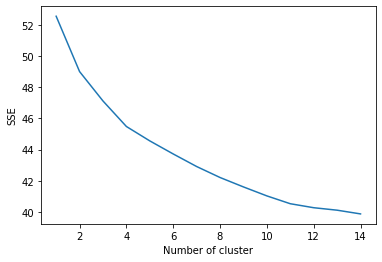

In [18]:
sse = {}
for k in range(1,15):
    kmeans = KMeans(n_clusters=k,random_state=0)
    kmeans.fit(london_grouped.drop('Neighborhood',axis=1))
    london_grouped['Cluster'] = kmeans.labels_
    sse[k] = kmeans.inertia_

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

The graph shows that the optimal k value is 11

Now we cluster the data into 11 clusters and assign each ward a cluster

In [19]:
clusterno = 11

kmeans = KMeans(n_clusters=clusterno,random_state=0)
kmeans.fit(london_grouped.drop('Neighborhood',axis=1))
london_grouped['Cluster'] = kmeans.labels_
london_grouped.groupby('Cluster')['Neighborhood'].count()


Cluster
0      88
1      19
2     196
3     111
4      18
5      46
6      70
7      25
8      35
9      17
10     13
Name: Neighborhood, dtype: int64

In [20]:
london_grouped.head()


,Neighborhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boarding House,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buddhist Temple,Buffet,Building,Bulgarian Restaurant,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Canal,Canal Lock,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Casino,Castle,Caucasian Restaurant,Chaat Place,Champagne Bar,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Cigkofte Place,Circus School,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Arts Building,College Cafeteria,College Quad,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cricket Ground,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Czech Restaurant,Dam,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Dive Bar,Doner Restaurant,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General College & University,General Entertainment,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hunan Restaurant,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Iraqi Restaurant,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,New American 

Now lets only get the required columns of ward and Cluster for this data

In [21]:
london_grouped1 = london_grouped[['Neighborhood', 'Cluster']]
london_grouped1.head()

,Neighborhood,Cluster
0,Abbey,2
1,Abbey Road,2
2,Abbey Wood,9
3,Abingdon,3
4,Acton Central,5


Now we need to assign locations for the wards and their top 5 venues and their Cluster number

In [22]:
#neighborhoods_venues_sorted1.columns

london_merged1 = data_wards

london_merged1 = london_merged1.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Ward')

london_merged1 = london_merged1.join(london_grouped1.set_index('Neighborhood'), on = 'Ward')
london_merged1.head() # check the last columns!

,Ward,District,Latitude,Longitude,Population,Households,Distance to station,Average Income,London zone,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Cluster
0,Abbey,Barking and Dagenham,51.539445,0.078631,80.544304,28.854430,0.361267,48866.265060,4.000000,Pub,Grocery Store,Supermarket,Coffee Shop,Sushi Restaurant,2
1,Abbey,Merton,51.414907,-0.191284,56.000000,24.793478,0.338333,67142.662116,3.000000,Pub,Grocery Store,Supermarket,Coffee Shop,Sushi Restaurant,2
2,Abbey Road,Westminster,51.534411,-0.178187,36.891803,17.078689,0.353824,58576.859504,2.000000,Café,Pub,Cricket Ground,Coffee Shop,Deli / Bodega,2
3,Abbey Wood,Greenwich,51.490570,0.113855,62.273810,23.642857,0.650402,44219.018405,4.000000,Supermarket,Accessories Store,Train Station,Platform,Playground,9
4,Abingdon,Kensington and Chelsea,51.497909,-0.197503,44.442396,21.529954,0.507347,67945.855759,1.038751,Italian Restaurant,Hotel,Café,Pub,Supermarket,3


We create a map of the clusters to see where they are

In [23]:
# create map
kclusters = clusterno
map_clusters = folium.Map(location=[latitude_x, longitude_y], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(london_merged1['Latitude'], london_merged1['Longitude'], london_merged1['District'], london_merged1['Cluster']):
    label = folium.Popup(str(poi) + 'Cluster' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

The next step is to find all wards where the number one venue is a Chinese or Asian Restaurant. **These are the areas to avoid but will provide the cluster number to provide best areas to open new restaurant based on location similarity**

In [24]:
filter_vals = ['Chinese Restaurant', 'Asian Restaurant']


In [25]:
df = london_merged1[(london_merged1['1st Most Common Venue'].isin(filter_vals)) | (london_merged1['2nd Most Common Venue'].isin(filter_vals))]

In [26]:
df

,Ward,District,Latitude,Longitude,Population,Households,Distance to station,Average Income,London zone,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Cluster
34,Belmont,Harrow,51.603792,-0.311381,57.165829,18.457286,1.190354,64096.062992,5.000000,Asian Restaurant,Pub,Chinese Restaurant,Pizza Place,Café,0
35,Belmont,Sutton,51.348764,-0.195839,55.087432,23.765027,0.613127,63988.333333,5.000000,Asian Restaurant,Pub,Chinese Restaurant,Pizza Place,Café,0
137,Coldharbour and New Eltham,Greenwich,51.433094,0.059643,58.368889,23.128889,0.745927,51299.626866,4.000000,Chinese Restaurant,Gym,Convenience Store,Auto Garage,Auto Dealership,3
169,Dollis Hill,Brent,51.564972,-0.235780,68.800000,21.846154,1.238310,45286.227545,3.000000,Electronics Store,Chinese Restaurant,Furniture / Home Store,Grocery Store,Music Store,3
294,Hendon,Barnet,51.588945,-0.222471,52.477273,19.786932,0.780533,51794.350282,3.051789,Grocery Store,Chinese Restaurant,Coffee Shop,Pizza Place,Plaza,5
307,Hillingdon East,Hillingdon,51.540144,-0.444906,76.307692,26.875740,1.592474,54188.687783,5.981900,Fast Food Restaurant,Chinese Restaurant,Construction & Landscaping,Pub,Park,4
325,Ickenham,Hillingdon,51.563244,-0.451905,50.916667,19.289216,0.802917,68132.411067,6.000000,Grocery Store,Chinese Restaurant,Pub,Park,Coffee Shop,8
363,Little Ilford,Newham,51.551264,0.060124,108.660131,33.398693,0.849956,41883.243243,3.448649,Restaurant,Asian Restaurant,Park,Gym / Fitness Center,Zoo Exhibit,7
380,Mawneys,Havering,51.592730,0.162218,57.013274,23.314159,2.514324,46770.529801,6.000000,Grocery Store,Chinese Restaurant,Pizza Place,Park,Zoo Exhibit,8
417,Northwood,Hillingdon,51.610892,-0.429298,33.754839,14.780645,0.724422,59230.867347,6.000000,Chinese Restaurant,Bakery,Pharmacy,Coffee Shop,Argentinian Restaurant,6


Now we need to determine what cluster numbers occur most frequently

In [27]:
df['Cluster'].value_counts()

8    3
3    3
9    2
5    2
0    2
7    1
6    1
4    1
2    1
Name: Cluster, dtype: int64

The clusters that occurs most often for Chinese or Asian Restaurants as a number 1 venue are 8 and 3, so now we filter the data to only give these clusters

In [28]:
req_clusters = [3, 8]

In [29]:
df_cluster1 = london_merged1[london_merged1.Cluster.isin(req_clusters)]

In [30]:
df_cluster1.head(5)

,Ward,District,Latitude,Longitude,Population,Households,Distance to station,Average Income,London zone,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Cluster
4,Abingdon,Kensington and Chelsea,51.497909,-0.197503,44.442396,21.529954,0.507347,67945.855759,1.038751,Italian Restaurant,Hotel,Café,Pub,Supermarket,3
6,Addiscombe East,Croydon,51.380070,-0.070786,63.351648,26.175824,0.369249,56441.964286,3.000000,Grocery Store,Tram Station,Bakery,Park,Café,8
7,Addiscombe West,Croydon,51.376259,-0.090736,74.186170,33.159574,0.072538,51008.610086,4.783518,Coffee Shop,Platform,Pub,Hotel,Bookstore,3
8,Addison,Hammersmith and Fulham,51.500444,-0.220302,74.309677,36.070968,0.363016,56245.454545,2.000000,Pub,Hotel,Grocery Store,Coffee Shop,Italian Restaurant,3
10,Aldersgate,City of London,51.519038,-0.096222,83.095238,48.285714,0.194389,65400.000000,1.000000,Coffee Shop,Hotel,Vietnamese Restaurant,Burger Joint,Scenic Lookout,3


In [31]:
df_cluster1.shape

(148, 15)

There are 148 wards within clusters 8 and 3

To help the Stakeholders make the decision we will now investigate average income for the wards in clusters 8 and 3

In [32]:
london_income = df_cluster1[["Ward","Average Income"]].groupby(['Ward'], as_index = False).mean()
london_income = london_income.sort_values('Average Income', ascending = False)
london_income.head(10)

,Ward,Average Income
24,Canary Wharf,79127.071823
49,Dundonald,71674.619289
93,Marylebone High Street,71422.065728
113,Queen's Gate,71284.449244
23,Campden,70699.806950
77,Ickenham,68132.411067
0,Abingdon,67945.855759
39,Courtfield,67432.150776
18,Brompton & Hans Town,67040.427280
100,North Richmond,66680.289855


We normalise the income for easier analysis

In [33]:
london_income['Normalized Income'] = london_income['Average Income']/london_income['Average Income'].max(axis=0)
london_income.head()

,Ward,Average Income,Normalized Income
24,Canary Wharf,79127.071823,1.000000
49,Dundonald,71674.619289,0.905817
93,Marylebone High Street,71422.065728,0.902625
113,Queen's Gate,71284.449244,0.900886
23,Campden,70699.806950,0.893497


We repeat for investigation Population for each London Ward with a Cluster ID of 8 or 3

In [34]:
london_population = df_cluster1[["Ward","Population"]].groupby(['Ward'], as_index = False).mean()
london_population = london_population.sort_values('Population', ascending = False)
london_population.head(10)

,Ward,Population
92,Manor Park,124.120000
90,Loxford,94.739726
53,East Ham South,94.138554
96,New Addington North,92.305085
144,West Ham,92.205882
138,Valentines,89.915584
72,Heston West,86.300699
89,Lower Morden,84.046296
4,Aldersgate,83.095238
107,Parsloes,78.088710


In [35]:
london_population['Normalized_population'] = london_population['Population']/london_population['Population'].max(axis=0)
london_population.head()

,Ward,Population,Normalized_population
92,Manor Park,124.120000,1.000000
90,Loxford,94.739726,0.763291
53,East Ham South,94.138554,0.758448
96,New Addington North,92.305085,0.743676
144,West Ham,92.205882,0.742877


Now we need to find the wards with Chinese or Asian Restuarants so that we can complete the analysis

In [36]:
london_rest = london_onehot.groupby(['Neighborhood']).sum().reset_index()

london_rest.head()

,Neighborhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boarding House,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buddhist Temple,Buffet,Building,Bulgarian Restaurant,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Canal,Canal Lock,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Casino,Castle,Caucasian Restaurant,Chaat Place,Champagne Bar,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Cigkofte Place,Circus School,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Arts Building,College Cafeteria,College Quad,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cricket Ground,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Czech Restaurant,Dam,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Dive Bar,Doner Restaurant,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General College & University,General Entertainment,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hunan Restaurant,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Iraqi Restaurant,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,New American 

Now  lets create a sum of the restaurants per ward for Chinese and Asian Restaurants

In [37]:
req_rest_count = london_rest[['Neighborhood','Chinese Restaurant', 'Asian Restaurant']]
req_rest_count["Sum of Restaurants"] = req_rest_count['Chinese Restaurant'] + req_rest_count['Asian Restaurant']
req_rest_count = req_rest_count[['Neighborhood', 'Sum of Restaurants']]
req_rest_count = req_rest_count.sort_values('Sum of Restaurants', ascending = False)
req_rest_count.rename(columns={'Neighborhood':'Ward'},inplace=True)
req_rest_count.head()

,Ward,Sum of Restaurants
338,Lancaster Gate,5
7,Addison,5
43,Bishopsgate,4
202,Fairfield,4
544,Swiss Cottage,4


Now we need to merge the summary dataframe along with the income and population dataframes to build the recommender system

In [38]:
alt_districts = df_cluster1

In [39]:
alt_districts = df_cluster1
alt_districts = alt_districts.merge(req_rest_count[['Ward', 'Sum of Restaurants']], on = 'Ward')
alt_districts.head()

,Ward,District,Latitude,Longitude,Population,Households,Distance to station,Average Income,London zone,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Cluster,Sum of Restaurants
0,Abingdon,Kensington and Chelsea,51.497909,-0.197503,44.442396,21.529954,0.507347,67945.855759,1.038751,Italian Restaurant,Hotel,Café,Pub,Supermarket,3,3
1,Addiscombe East,Croydon,51.380070,-0.070786,63.351648,26.175824,0.369249,56441.964286,3.000000,Grocery Store,Tram Station,Bakery,Park,Café,8,1
2,Addiscombe West,Croydon,51.376259,-0.090736,74.186170,33.159574,0.072538,51008.610086,4.783518,Coffee Shop,Platform,Pub,Hotel,Bookstore,3,2
3,Addison,Hammersmith and Fulham,51.500444,-0.220302,74.309677,36.070968,0.363016,56245.454545,2.000000,Pub,Hotel,Grocery Store,Coffee Shop,Italian Restaurant,3,5
4,Aldersgate,City of London,51.519038,-0.096222,83.095238,48.285714,0.194389,65400.000000,1.000000,Coffee Shop,Hotel,Vietnamese Restaurant,Burger Joint,Scenic Lookout,3,0


In [40]:
alt_districts = alt_districts.merge(london_population[['Ward','Population','Normalized_population']],on='Ward')
alt_districts = alt_districts.merge(london_income[['Ward','Average Income','Normalized Income']],on='Ward')
alt_districts.shape

#alt_distrcits = alt_districts.merge(london_income[['District','Average Income','Normalized Income']],on='District')

alt_districts.shape
alt_districts.head()

#possible_neighborhoods = possible_neighborhoods.merge(bangalore_veg[['Neighborhoods','NumberOfVegRestaurants','NumberOfNonVeganrestaurants']],on='Neighborhoods')

,Ward,District,Latitude,Longitude,Population_x,Households,Distance to station,Average Income_x,London zone,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Cluster,Sum of Restaurants,Population_y,Normalized_population,Average Income_y,Normalized Income
0,Abingdon,Kensington and Chelsea,51.497909,-0.197503,44.442396,21.529954,0.507347,67945.855759,1.038751,Italian Restaurant,Hotel,Café,Pub,Supermarket,3,3,44.442396,0.358060,67945.855759,0.858693
1,Addiscombe East,Croydon,51.380070,-0.070786,63.351648,26.175824,0.369249,56441.964286,3.000000,Grocery Store,Tram Station,Bakery,Park,Café,8,1,63.351648,0.510406,56441.964286,0.713308
2,Addiscombe West,Croydon,51.376259,-0.090736,74.186170,33.159574,0.072538,51008.610086,4.783518,Coffee Shop,Platform,Pub,Hotel,Bookstore,3,2,74.186170,0.597697,51008.610086,0.644642
3,Addison,Hammersmith and Fulham,51.500444,-0.220302,74.309677,36.070968,0.363016,56245.454545,2.000000,Pub,Hotel,Grocery Store,Coffee Shop,Italian Restaurant,3,5,74.309677,0.598692,56245.454545,0.710824
4,Aldersgate,City of London,51.519038,-0.096222,83.095238,48.285714,0.194389,65400.000000,1.000000,Coffee Shop,Hotel,Vietnamese Restaurant,Burger Joint,Scenic Lookout,3,0,83.095238,0.669475,65400.000000,0.826519


Now we can create a ranking for each London ward for clusters 8 and 3 areas. The data still includes details for those wards with Chinese and Asian restaurants

In [41]:
alt_districts['Ranking'] = alt_districts['Normalized_population'] * 0.3 + alt_districts['Normalized Income'] * 0.6 + alt_districts['Sum of Restaurants'] * 0.1
alt_districts = alt_districts.sort_values(by='Ranking',ascending=False)
alt_districts.reset_index(inplace=True, drop=True)

alt_districts.head()

,Ward,District,Latitude,Longitude,Population_x,Households,Distance to station,Average Income_x,London zone,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Cluster,Sum of Restaurants,Population_y,Normalized_population,Average Income_y,Normalized Income,Ranking
0,Addison,Hammersmith and Fulham,51.500444,-0.220302,74.309677,36.070968,0.363016,56245.454545,2.000000,Pub,Hotel,Grocery Store,Coffee Shop,Italian Restaurant,3,5,74.309677,0.598692,56245.454545,0.710824,1.106102
1,Lancaster Gate,Westminster,51.512921,-0.185634,54.995816,28.267782,0.268234,60712.738854,1.076433,Café,Hotel,Pub,Coffee Shop,Chinese Restaurant,3,5,54.995816,0.443086,60712.738854,0.767282,1.093295
2,Portsoken,City of London,51.514573,-0.075655,59.133333,27.466667,0.114505,65400.000000,1.000000,Hotel,Coffee Shop,Gym / Fitness Center,Restaurant,Pub,3,3,59.133333,0.476421,65400.000000,0.826519,0.938837
3,Abingdon,Kensington and Chelsea,51.497909,-0.197503,44.442396,21.529954,0.507347,67945.855759,1.038751,Italian Restaurant,Hotel,Café,Pub,Supermarket,3,3,44.442396,0.358060,67945.855759,0.858693,0.922634
4,Bishopsgate,City of London,51.517767,-0.080903,6.904762,4.190476,0.187770,65400.000000,1.000000,Coffee Shop,Hotel,Food Truck,Pub,Cocktail Bar,3,4,6.904762,0.055630,65400.000000,0.826519,0.912600


Let's inspect the areas where there are the most Chinese or Asian Restaurants

In [42]:
no_ca = alt_districts[alt_districts['Sum of Restaurants'] >0]

no_ca.shape

(72, 21)

In [43]:
map_ca = folium.Map(location=[latitude_x, longitude_y], zoom_start=10)

for lat, lng, nei in zip(no_ca['Latitude'], no_ca['Longitude'], no_ca['Ward']):
    
    label = '{}'.format(nei)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_ca)  
    
map_ca

The wards with the most Chinese restaurants are within the City of London

Now we need to remove the wards where the Restaurant count for Asian Restaurants is greater than 1 so that competition is minimised

In [44]:
no_rest = alt_districts[alt_districts['Sum of Restaurants'] <2]

no_rest.shape

(118, 21)

###### There are 118 London Wards with less than 2 Chinese or Asian restaurant nearby

Now we can display the top 10 recommended locations based on the ranking previously carried out for the Stakeholder to make their decision

In [45]:
top10 = no_rest[['Ward','Latitude','Longitude','1st Most Common Venue','2nd Most Common Venue','3rd Most Common Venue', 'Ranking', 'Normalized Income', 'Normalized_population']]

#top10 = top10.groupby(['Ward','Latitude','Longitude','1st Most Common Venue','2nd Most Common Venue','3rd Most Common Venue','Normalized Income', 'Normalized_population'])['Ranking'].unique()
#top10 = pd.DataFrame(top10).reset_index()
top10 = top10.sort_values('Ranking', ascending = False)
top10 = top10.head(10)

top10


,Ward,Latitude,Longitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,Ranking,Normalized Income,Normalized_population
15,Canary Wharf,51.502083,-0.021704,Coffee Shop,Gym / Fitness Center,Sandwich Place,0.767878,1.000000,0.559592
19,Lower Morden,51.387281,-0.221036,Grocery Store,Electronics Store,Chinese Restaurant,0.752664,0.749205,0.677137
21,Ickenham,51.563244,-0.451905,Grocery Store,Chinese Restaurant,Pub,0.739697,0.861051,0.410221
24,Poplar,51.509729,-0.013561,Coffee Shop,Italian Restaurant,Park,0.728852,0.740502,0.615170
25,Ealing Broadway,51.515618,-0.309373,Coffee Shop,Pub,Bakery,0.727918,0.806412,0.480236
29,Campden,51.504695,-0.195293,Pub,Garden,Café,0.721650,0.893497,0.285172
31,Courtfield,51.492352,-0.180804,Hotel,Bakery,Burger Joint,0.717339,0.852201,0.353395
34,Dundonald,51.414239,-0.212102,Grocery Store,Park,Pub,0.707653,0.905817,0.547210
36,Royal Docks,51.502138,0.040929,Airport Service,Hotel,Coffee Shop,0.704009,0.744372,0.524620
38,Aldersgate,51.519038,-0.096222,Coffee Shop,Hotel,Vietnamese Restaurant,0.696754,0.826519,0.669475


Let's plot these top 10 locations on a map to make it easier for the Stakeholder to make their decision

In [46]:
map_locs = folium.Map(location=[latitude_x, longitude_y], zoom_start=10)

for lat, lng, nei in zip(top10['Latitude'], top10['Longitude'], top10['Ward']):
    
    label = '{}'.format(nei)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_locs)  
    
map_locs

We can also plot the Normalised Incomes for Top 10 recommended Wards to show how the different locations compare. The higher the income of the area the better the chance of people being able to spend money visiting restaurants

[Text(0, 0, 'Canary Wharf'),
 Text(1, 0, 'Lower Morden'),
 Text(2, 0, 'Ickenham'),
 Text(3, 0, 'Poplar'),
 Text(4, 0, 'Ealing Broadway'),
 Text(5, 0, 'Campden'),
 Text(6, 0, 'Courtfield'),
 Text(7, 0, 'Dundonald'),
 Text(8, 0, 'Royal Docks'),
 Text(9, 0, 'Aldersgate')]

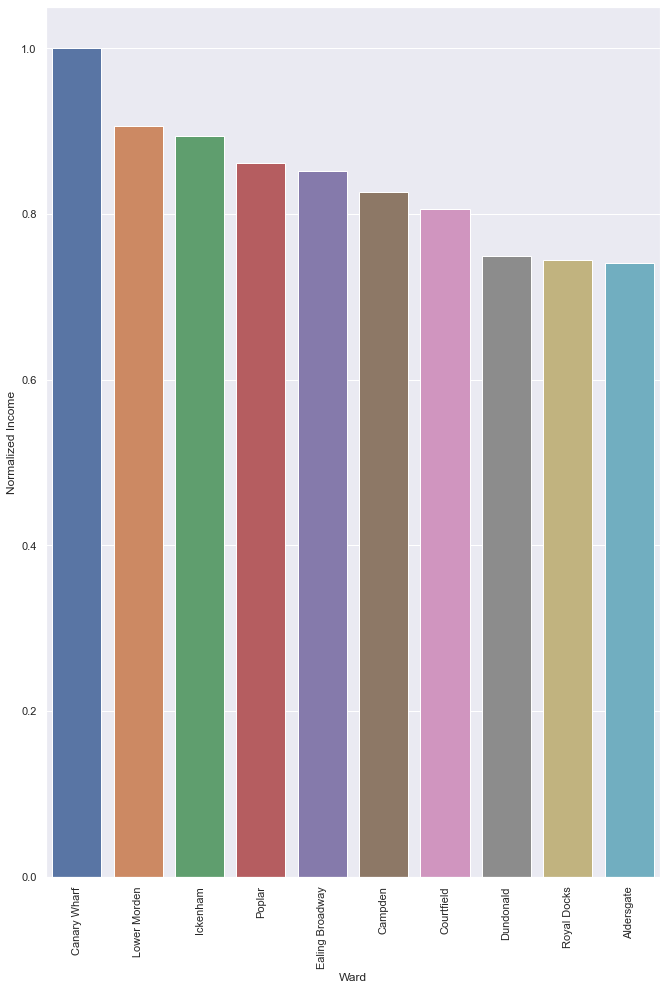

In [47]:
top_inc = top10.sort_values('Normalized Income', ascending = False)

sns.set(rc={'figure.figsize':(11,16)})
plot = sns.barplot(x='Ward',y='Normalized Income',data=top_inc)
plot.set_xticklabels(top10['Ward'],rotation=90)

We can alternatively look at the plot for Normalised Populations for Top 10 recommended Wards

[Text(0, 0, 'Canary Wharf'),
 Text(1, 0, 'Lower Morden'),
 Text(2, 0, 'Ickenham'),
 Text(3, 0, 'Poplar'),
 Text(4, 0, 'Ealing Broadway'),
 Text(5, 0, 'Campden'),
 Text(6, 0, 'Courtfield'),
 Text(7, 0, 'Dundonald'),
 Text(8, 0, 'Royal Docks'),
 Text(9, 0, 'Aldersgate')]

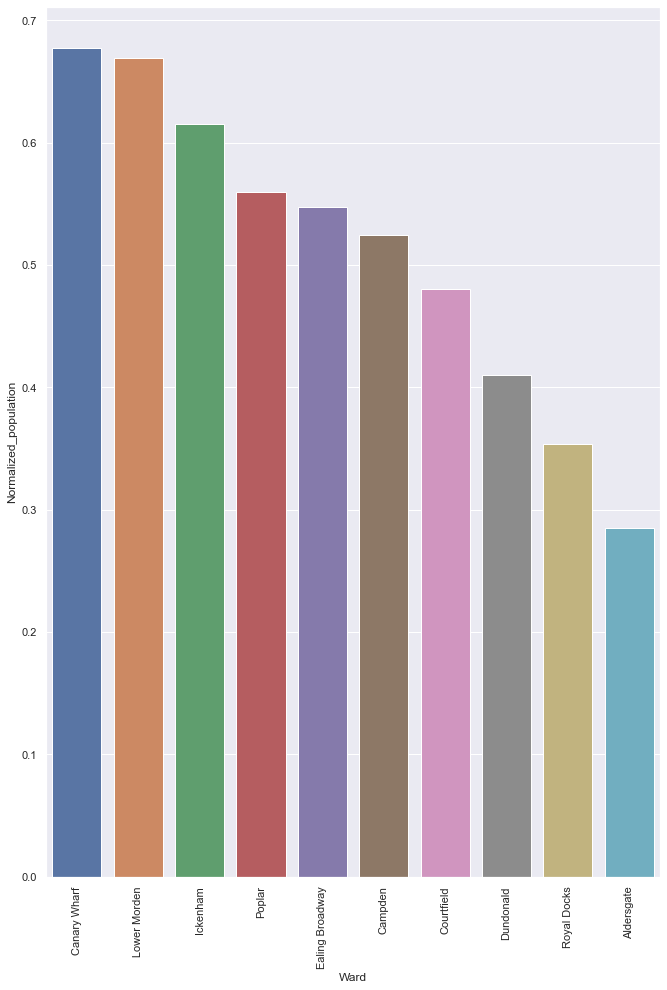

In [48]:
top_pop = top10.sort_values('Normalized_population', ascending = False)

sns.set(rc={'figure.figsize':(11,16)})
plot = sns.barplot(x='Ward',y='Normalized_population',data=top_pop)
plot.set_xticklabels(top10['Ward'],rotation=90)

Let's also plot the ranking for each ward

[Text(0, 0, 'Canary Wharf'),
 Text(1, 0, 'Lower Morden'),
 Text(2, 0, 'Ickenham'),
 Text(3, 0, 'Poplar'),
 Text(4, 0, 'Ealing Broadway'),
 Text(5, 0, 'Campden'),
 Text(6, 0, 'Courtfield'),
 Text(7, 0, 'Dundonald'),
 Text(8, 0, 'Royal Docks'),
 Text(9, 0, 'Aldersgate')]

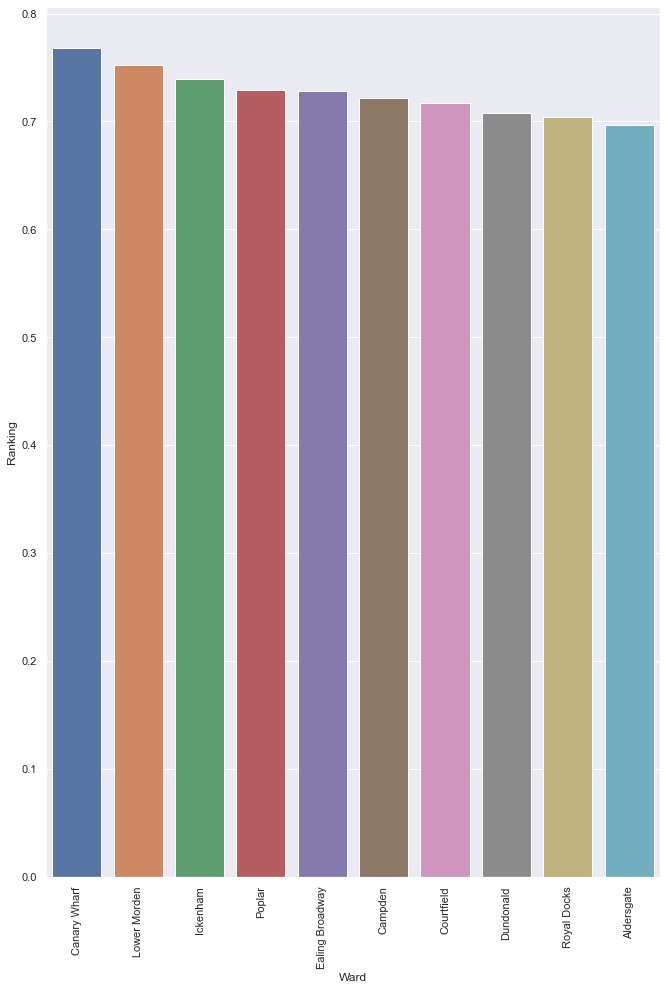

In [49]:
top_rank = top10.sort_values('Ranking', ascending = False)

sns.set(rc={'figure.figsize':(11,16)})
plot = sns.barplot(x='Ward',y='Ranking',data=top_rank)
plot.set_xticklabels(top10['Ward'],rotation=90)

## Results and Discussion <a name="results"></a>

Our analysis shows that there are a great number of Asian and Chinese restaurants within the City of London, so although this is a popular area, competition is likely to be great.

We clustered all wards in order to obtain areas or similarity and then identified the clusters where there were the highest number of Asian or Chinese restaurants. This was to provide information on wards that were categorised the same as high density of restaurants but where there were less than two Chinese or Asian restaurants in the vicinity.

Directing our search to areas where the top two nearest venues are not Chinese or Asian Restaurants we were then able to assess location information along with average income and average population in order to provide information on potential clients to the restaurant.

These locations were ranked by income, population and current presence of Chinese or Asian restaurants.

We then filtered the top ten potential location based on this ranking.

This, of course, does not imply that those wards are actually optimal locations for a new restaurant! Purpose of this analysis was to only provide info on areas in London but not crowded with existing Chinese restaurants - it is entirely possible that there is a very good reason for small number of restaurants in any of those areas, reasons which would make them unsuitable for a new restaurant regardless of lack of competition in the area. Recommended wards should therefore be considered only as a starting point for more detailed analysis which could eventually result in location which has not only no nearby competition but also other factors taken into account and all other relevant conditions met.

## Conclusion <a name="conclusion"></a>

The purpose of this project was to identify London areas with low numbers of Chinese or Asian restaurants in order to aid stakeholders in narrowing down the search for optimal location for a new Chinese restaurant. By calculating restaurant density distribution from Foursquare data we have conducted clustering of those locations. We then identified similar clusters to those where Chinese restaurants were already present and then ranked areas where there was a low presence of Chinese resturants in combination with local population and income. We then presented the top ten locations to be used as starting points for final exploration by stakeholders.

Final decision on optimal restaurant location will be made by stakeholders based on specific characteristics of neighborhoods and locations in every recommended zone, taking into consideration additional factors like attractiveness of each location (proximity to park or water), levels of noise / proximity to major roads, real estate availability, prices, social and economic dynamics of every neighborhood etc.